<div>
<img src=https://www.institutedata.com/wp-content/uploads/2019/10/iod_h_tp_primary_c.svg width="300">
</div>

# Lab 6.4
# *PCA Lab*

**In this lab, we will:**
- Explore how PCA is related to correlation.
- Use PCA to perform dimensionality reduction.

### 1. Load Data

Features are computed from a digitized image of a fine needle aspirate (FNA) of a breast mass. They describe characteristics of the cell nuclei present in the image. n the 3-dimensional space is that described in: [K. P. Bennett and O. L. Mangasarian: "Robust Linear Programming Discrimination of Two Linearly Inseparable Sets", Optimization Methods and Software 1, 1992, 23-34].

This database is also available through the UW CS ftp server: ftp ftp.cs.wisc.edu cd math-prog/cpo-dataset/machine-learn/WDBC/

Also can be found on UCI Machine Learning Repository: https://archive.ics.uci.edu/ml/datasets/Breast+Cancer+Wisconsin+%28Diagnostic%29

Attribute Information:

1) ID number 2) Diagnosis (M = malignant, B = benign) 3-32)

Ten real-valued features are computed for each cell nucleus:

a) radius (mean of distances from center to points on the perimeter) b) texture (standard deviation of gray-scale values) c) perimeter d) area e) smoothness (local variation in radius lengths) f) compactness (perimeter^2 / area - 1.0) g) concavity (severity of concave portions of the contour) h) concave points (number of concave portions of the contour) i) symmetry j) fractal dimension ("coastline approximation" - 1)

The mean, standard error and "worst" or largest (mean of the three largest values) of these features were computed for each image, resulting in 30 features. For instance, field 3 is Mean Radius, field 13 is Radius SE, field 23 is Worst Radius.

All feature values are recoded with four significant digits.

Missing attribute values: none

Class distribution: 357 benign, 212 malignant

In [77]:
# IMPORT LABRARIES
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier


In [2]:
breast_cancer_csv = 'breast-cancer-wisconsin-data.csv'

In [5]:
df = pd.read_csv(breast_cancer_csv, index_col = 'id')

df.drop(columns = 'Unnamed: 32')

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
id,,,,,,,,,,,,,,,,,,,,,
842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820


In [175]:
df.shape

(569, 32)

### 2. EDA 

Explore dataset. Clean data. Find correlation. 

<Figure size 1440x864 with 0 Axes>

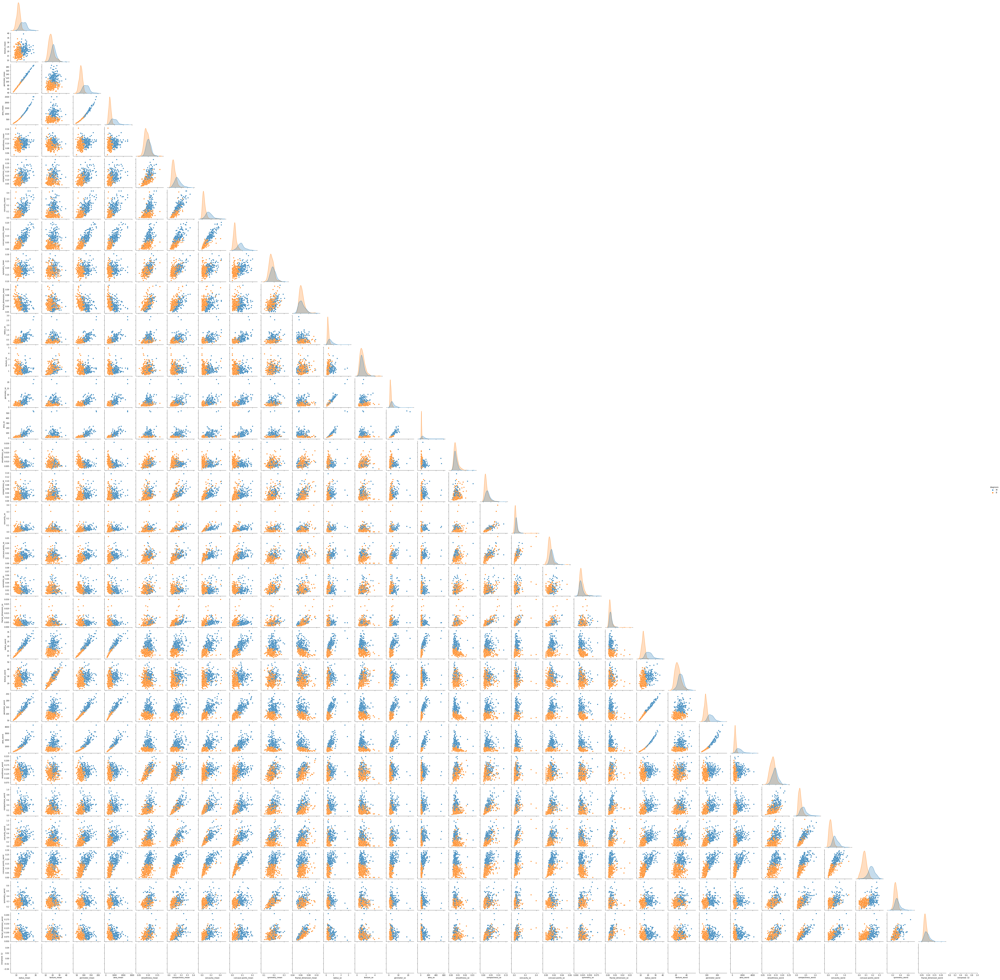

In [7]:
plt.figure(figsize = (20,12))
sns.pairplot(df, hue = 'diagnosis', data = df, corner = True)
plt.show()

### 3. Subset & Standardised

Subset the data to only include all columns except diagnosis. We will be comparing the principal components to age specifically, so we are leaving age out.

In [10]:
# ANSWER
X = df.drop(columns = ['diagnosis'])
y = df['diagnosis']

In [24]:
X = X.drop(columns = ['Unnamed: 32'])

In [26]:
scaler = StandardScaler()
X = scaler.fit_transform(X)

In [183]:
X.shape

(569, 30)

### Calculate correlation matrix

We will be using the correlation matrix to calculate the eigenvectors and eigenvalues.

In [190]:
# ANSWER
df_corr = pd.DataFrame(X)
correlation_matrix = df_corr.corr()

In [191]:
correlation_matrix.shape

(30, 30)

### 4. Calculate the eigenvalues and eigenvectors from the correlation matrix

numpy has a convenient function to calculate this:

    eigenvalues, eigenvectors = np.linalg.eig(correlation_matrix)

In [192]:
# ANSWER

eigenvalues, eigenvectors = np.linalg.eig(correlation_matrix)

In [194]:
eigenvalues.shape

(30,)

### 5. Calculate and plot the explained variance

A useful measure is the **explained variance**, which is calculated from the eigenvalues. 

The explained variance tells us how much information (variance) is captured by each principal component.

### $$ ExpVar_i = \bigg(\frac{eigenvalue_i}{\sum_j^n{eigenvalue_j}}\bigg) * 100$$

In [178]:
exp_var = (eigenvalues/eigenvalues.sum())*100


In [208]:
def calculate_cum_var_exp(eig_vals):
    cum_exp = 0
    cum_var_exp = []
    '''
    Calculate Explained Variance from Eigenvalues
    
    Return a list or array containing the cumulative explained variance 
    '''
    for e in eig_vals:
        expvar = ((e/np.sum(eig_vals))*100)
        cum_exp += expvar
        cum_var_exp.append(cum_exp)
    #Need a loop one element at a time +=
    return cum_var_exp

In [209]:
calculate_cum_var_exp(eigenvalues)

[44.27202560752635,
 63.24320765155942,
 72.63637090899081,
 79.23850582446097,
 84.73427431680724,
 88.75879635669058,
 91.00953006967309,
 92.59825386969442,
 93.98790324425353,
 95.15688143366668,
 96.1366004212647,
 97.00713832200258,
 97.8116633091993,
 98.33502905469194,
 98.64881227145469,
 98.91502160796992,
 99.11301840050234,
 99.28841434552498,
 99.45333965144751,
 99.45378313419025,
 99.45627914451494,
 99.46157693741876,
 99.48457848366935,
 99.5118372832171,
 99.56344152113363,
 99.6236248778008,
 99.7047610036907,
 99.79622567879613,
 99.90009035363,
 100.00000000000003]

In [210]:
def plot_var_exp(eig_vals):
    
    cum_var_exp = calculate_cum_var_exp(eig_vals)
    
    plt.figure(figsize=(9,7))

    component_number = [i+1 for i in range(len(cum_var_exp))]

    plt.plot(component_number, cum_var_exp, lw=7)

    plt.axhline(y=0, linewidth=5, color='grey', ls='dashed')
    plt.axhline(y=100, linewidth=3, color='grey', ls='dashed')

    ax = plt.gca()
    ax.set_xlim([1,30])
    ax.set_ylim([-5,105])

    ax.set_ylabel('cumulative variance explained', fontsize=16)
    ax.set_xlabel('component', fontsize=16)

    for tick in ax.xaxis.get_major_ticks():
        tick.label.set_fontsize(12) 

    for tick in ax.yaxis.get_major_ticks():
        tick.label.set_fontsize(12) 

    ax.set_title('component vs cumulative variance explained\n', fontsize=20)

    plt.show()

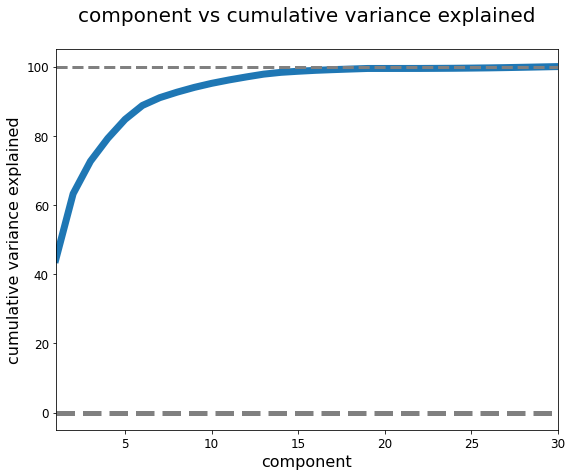

In [211]:
plot_var_exp(eigenvalues)

### 6. Using sklearn For PCA

    from sklearn.decomposition import PCA
    
- Create an instance of PCA
- Fit to standardised X
- Plot the explained variance
- Create PairPlot of PCA

In [171]:
# ANSWER
# Create an instance of PCA
pca = PCA(n_components = 30)
# Fit Xs
pca.fit(X)

PCA(n_components=30)

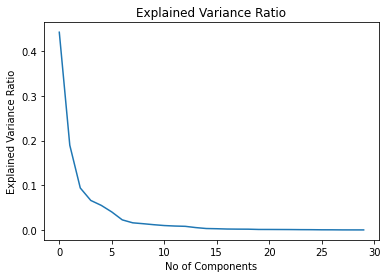

In [172]:
# ANSWER
# Plot explained_variance_ratio_
exp_var_ratio = pca.explained_variance_ratio_

plt.plot(exp_var_ratio)
plt.title('Explained Variance Ratio')
plt.xlabel('No of Components')
plt.ylabel('Explained Variance Ratio')
plt.show()

In [173]:
exp_var_ratio

array([4.42720256e-01, 1.89711820e-01, 9.39316326e-02, 6.60213492e-02,
       5.49576849e-02, 4.02452204e-02, 2.25073371e-02, 1.58872380e-02,
       1.38964937e-02, 1.16897819e-02, 9.79718988e-03, 8.70537901e-03,
       8.04524987e-03, 5.23365745e-03, 3.13783217e-03, 2.66209337e-03,
       1.97996793e-03, 1.75395945e-03, 1.64925306e-03, 1.03864675e-03,
       9.99096464e-04, 9.14646751e-04, 8.11361259e-04, 6.01833567e-04,
       5.16042379e-04, 2.72587995e-04, 2.30015463e-04, 5.29779290e-05,
       2.49601032e-05, 4.43482743e-06])

In [174]:
exp_var_ratio.sum()

1.0000000000000002

In [158]:
components = np.arange(pca.n_components_) + 1

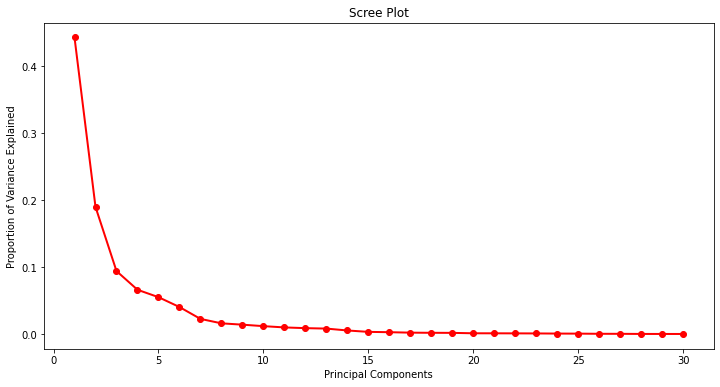

In [159]:
#Plotting Screeplot

plt.figure(figsize=(12,6))
plt.plot(components, exp_var_ratio, 'ro-', linewidth =2)
plt.title('Scree Plot')
plt.xlabel('Principal Components')
plt.ylabel('Proportion of Variance Explained')
plt.show()

In [160]:
X2 = pca.transform(X)

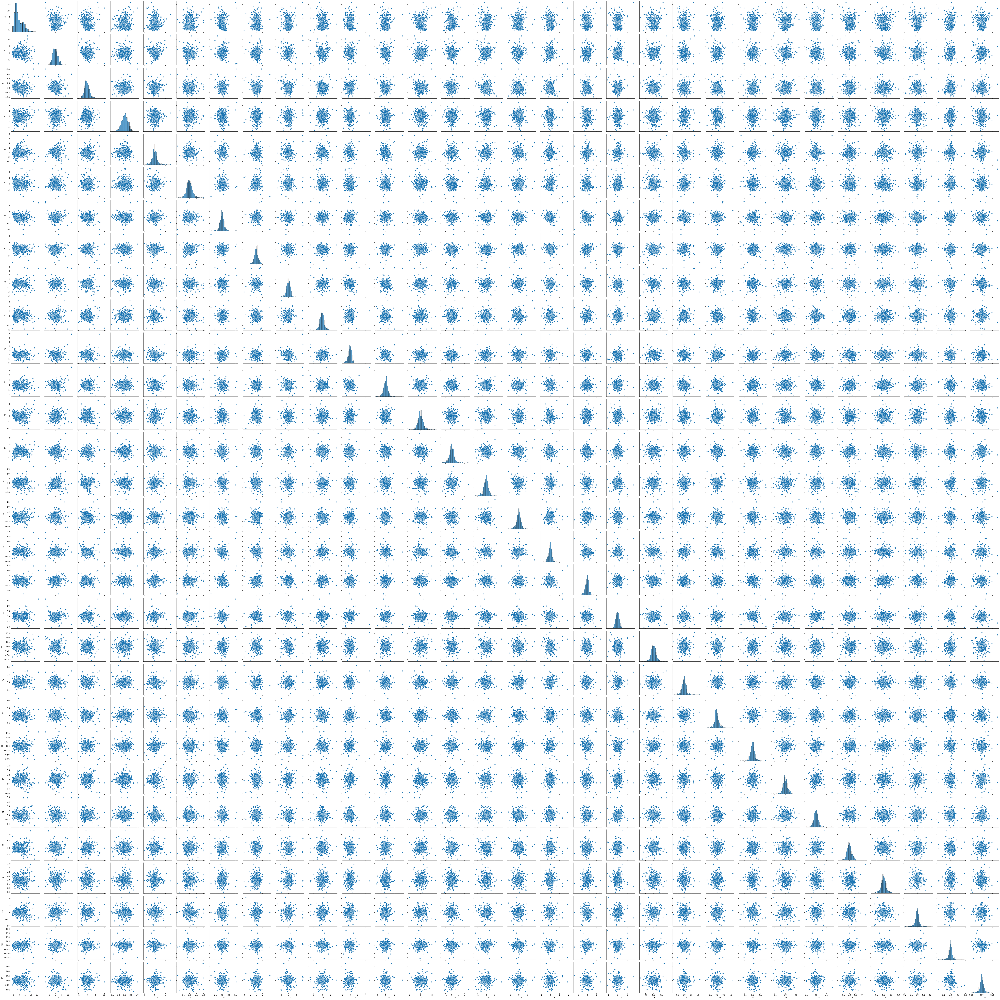

In [163]:
# ANSWER
# Create PairPlot of PCA
df_X2 = pd.DataFrame(X2)

sns.pairplot(df_X2)
plt.show()

### 7. Split Data to 80/20 and Use PCA you got in (6) as X

Split data 80/20 and Use KNN to find score.

In [161]:
# ANSWER
# Split Data
X_train,X_test, y_train,y_test = train_test_split(X2,y,test_size = 0.2, random_state= 1)

knn = KNeighborsClassifier(n_neighbors = 5)
knn.fit(X_test,y_test)


KNeighborsClassifier()

In [162]:
# ANSWER
knn.score(X_train,y_train)

0.9516483516483516

**References**

[Breast Cancer Wisconsin (Diagnostic) Data Set](https://www.kaggle.com/uciml/breast-cancer-wisconsin-data/downloads/breast-cancer-wisconsin-data.zip/2)

[Breast Cancer Machine Learning Prediction](https://gtraskas.github.io/post/breast_cancer/)

[Understanding PCA (Principal Component Analysis) with Python](https://towardsdatascience.com/dive-into-pca-principal-component-analysis-with-python-43ded13ead21)



---



---



> > > > > > > > > © 2019 Institute of Data


---



---



